### Import Requirement

In [1]:
import torch 
from cross_attention import AttentionStore, show_cross_attention, run_and_display, AttentionReplace, LocalBlend , AttentionRefine, get_equalizer, AttentionReweight
import utils
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

from absl_mock import Mock_Flag 

from config import read_cfg
read_cfg()
flags = Mock_Flag() 
FLAGS = flags.FLAGS
NUM_DIFFUSION_STEPS=FLAGS.num_diffusion_steps

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

Loaded all models to GPU


  0%|          | 0/51 [00:00<?, ?it/s]

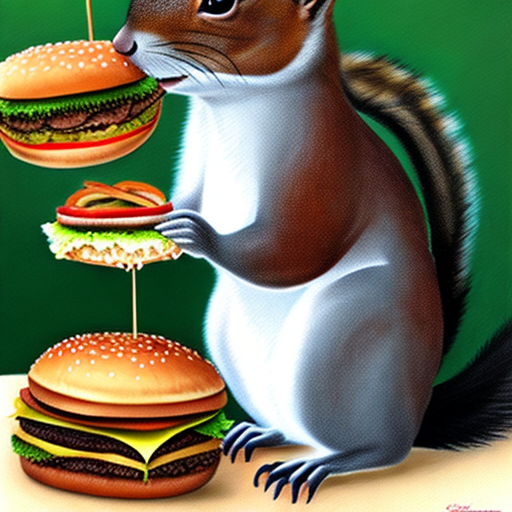

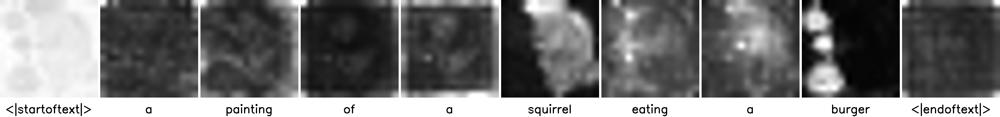

In [2]:
prompts= ["A painting of a squirrel eating a burger"]
g_cpu = torch.Generator().manual_seed(8888)
controller = AttentionStore()
# g_cpu= g_cpu.to(device)'
#prompts=prompts.to(device)
image, x_t = run_and_display(prompts, controller, latent=None, run_baseline=False, generator=g_cpu)
show_cross_attention(prompts, controller, res=16, from_where=("up", "down"))

### Image to Image 
1. This initial by User's Image  --> Generate the Prompt base on (Image Captioning + Artist style + flavors, meduim, movement, trending) --> New editted Prompt --> Generate the New Image 


In [ ]:
## Generate prompt with Clip Interrogator 
''''''
Requirement for this to work
['pip', 'install', 'open_clip_torch'],
        ['pip', 'install', '-e', 'git+https://github.com/TranNhiem/BLIP_caption_generator.git@lib#egg=blip'],
        ['git', 'clone', 'https://github.com/TranNhiem/clip-interrogator.git']
'''
image_path

### Replacement Edit
Noted the Init prompt and New prompt Should have the same LENGTH otherwise it will show the ERROR
--> Fixing this issue in the future 

w.o. prompt-to-prompt


  0%|          | 0/51 [00:00<?, ?it/s]

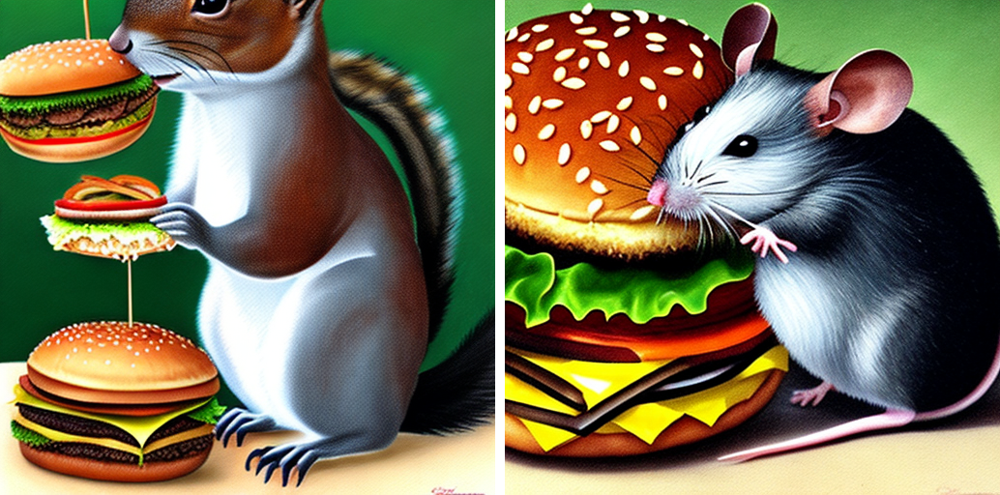

with prompt-to-prompt


  0%|          | 0/51 [00:00<?, ?it/s]

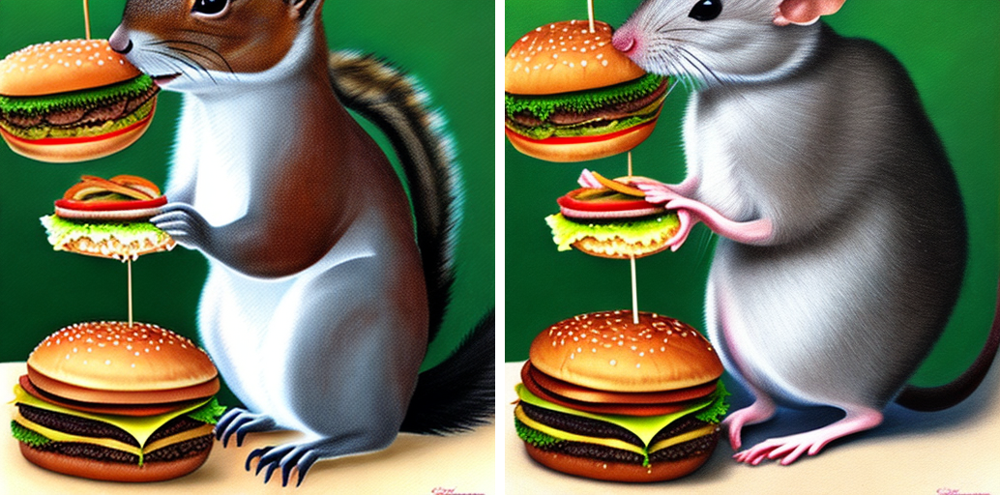

In [ ]:
prompts = ["A painting of a squirrel eating a burger",
           "A painting of a mouse eating a burger"]

controller = AttentionReplace(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8, self_replace_steps=0.4)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=True)

### Modify Cross-Attention injection #steps for specific words
--> Control the (the restriction on our lion by reducing the number of cross-attention injection with respect to the word "lion")
--> The higher of cross replace_step the matching context of replace object will be more accurate

  0%|          | 0/51 [00:00<?, ?it/s]

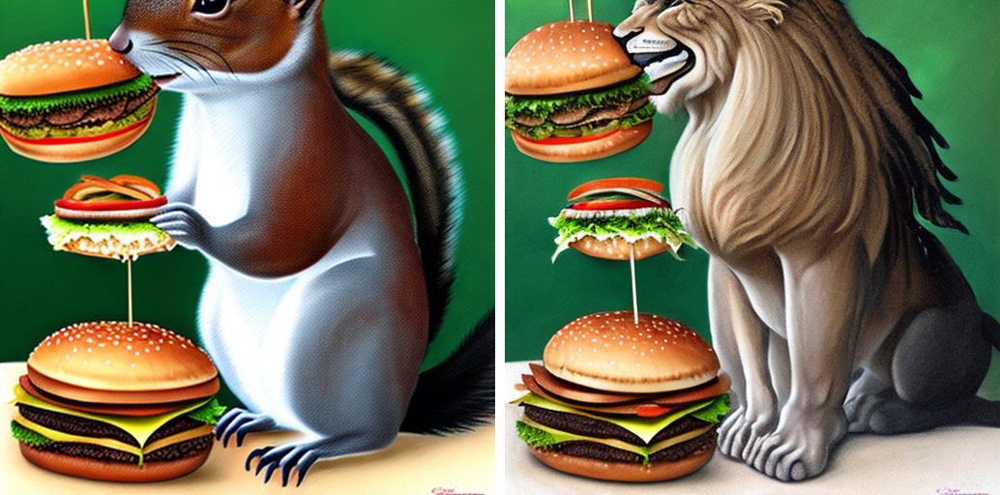

In [ ]:
prompts = ["A painting of a squirrel eating a burger",
           "A painting of a lion eating a burger"]
controller = AttentionReplace(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps={"default_": 10., "lion": 1.},
                              self_replace_steps=0.4)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)

  0%|          | 0/51 [00:00<?, ?it/s]

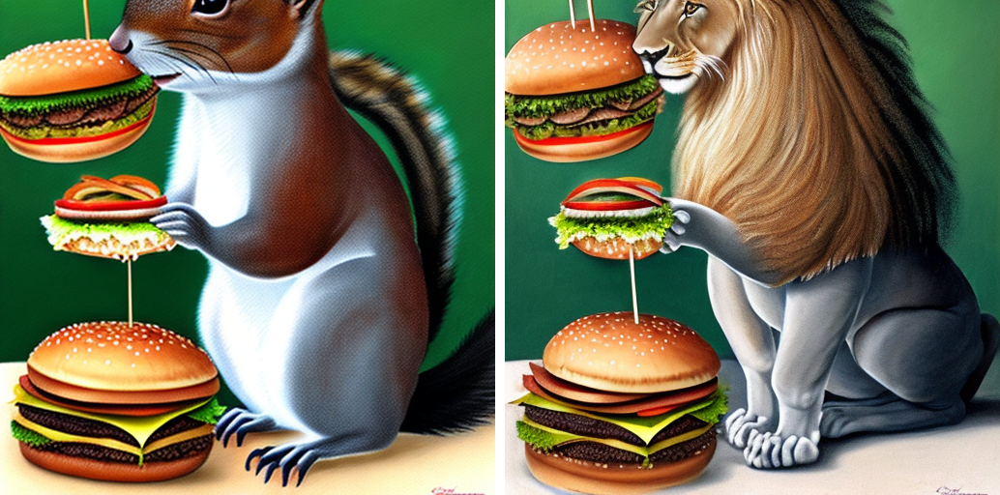

In [ ]:
## We Increasing the Freedom of Object Replacement context information 
prompts = ["A painting of a squirrel eating a burger",
           "A painting of a lion eating a burger"]
controller = AttentionReplace(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps={"default_": 1., "lion": 0.1},
                              self_replace_steps=0.4)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)

### Only REPLACE the certain area (Local Edit)
--> This will only replace the erea corresponding of the replace object in (Editted prompt)

  0%|          | 0/51 [00:00<?, ?it/s]

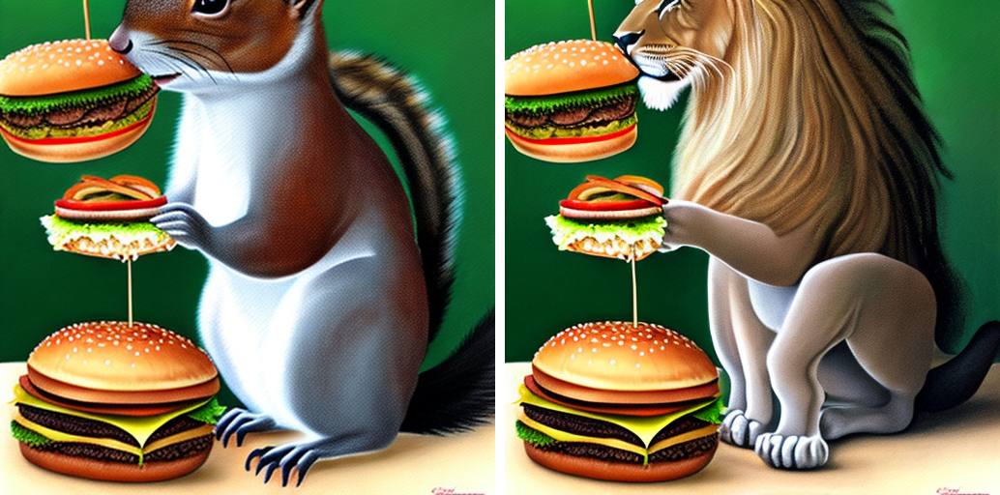

In [ ]:
prompts = ["A painting of a squirrel eating a burger",
           "A painting of a lion eating a burger"]
lb = LocalBlend(prompts, ("squirrel", "lion"))
controller= AttentionReplace(prompts,NUM_DIFFUSION_STEPS,
                              cross_replace_steps={"default_": 1., "lion": .4},self_replace_steps=0.4, local_blend=lb )
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)

### Refinement Edit or Style Image Editting --> Improving the image Context 
* Slightly change the context of the image with editing prompt --> 
    --> The editing prompt and init prompt can be different length 

* Future Support init image input 

  0%|          | 0/51 [00:00<?, ?it/s]

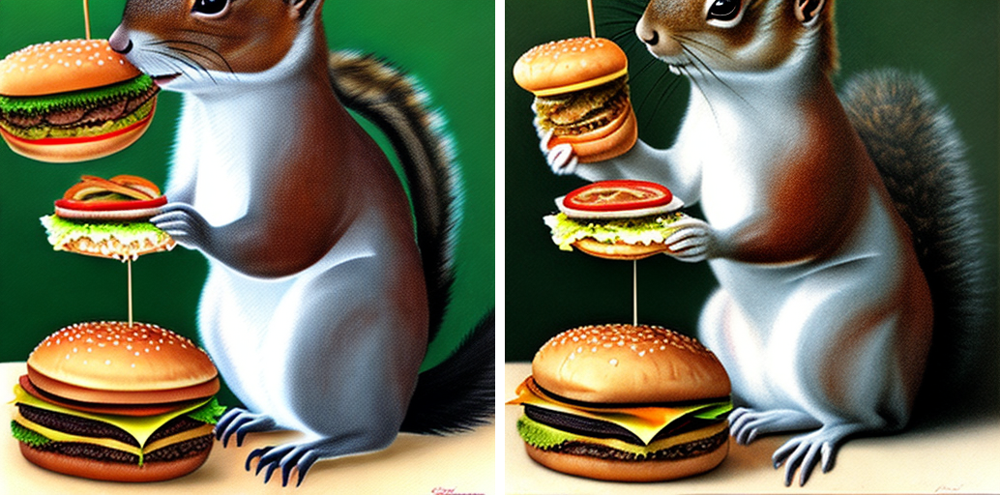

In [ ]:
prompts = ["A painting of a squirrel eating a burger",
           "A neoclassical painting of a squirrel eating a burger"]
controller = AttentionRefine(prompts, NUM_DIFFUSION_STEPS,
                             cross_replace_steps=.5, 
                             self_replace_steps=.2)
_ = run_and_display(prompts, controller, latent=x_t)

  0%|          | 0/51 [00:00<?, ?it/s]

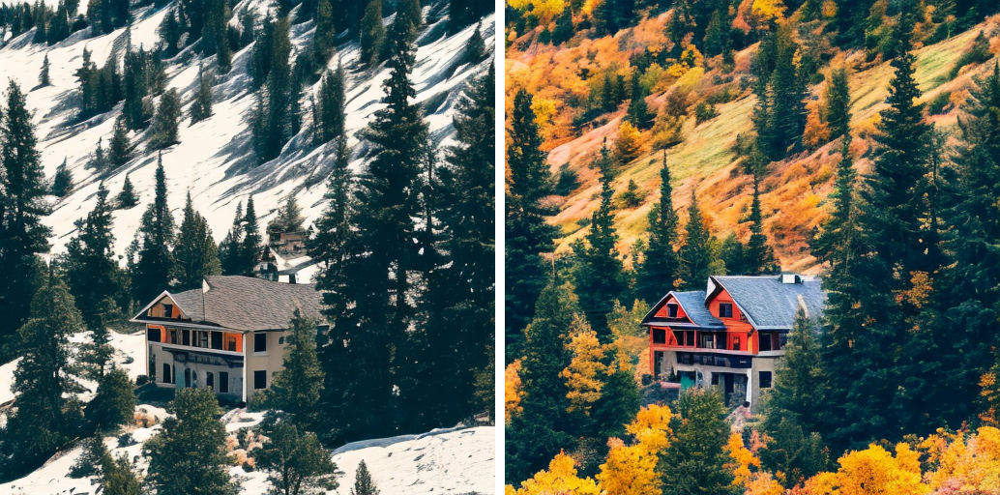

In [ ]:
prompts = ["a photo of a house on a mountain",
           "a photo of a house on a mountain at fall"]

controller = AttentionRefine(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8,
                             self_replace_steps=.4)
_ = run_and_display(prompts, controller, latent=x_t)

### Refinement with editing Local context 
### --> Slightly Change the Local 

In [ ]:

prompts = ["soup",
           "chinese chiken fry rice"] 

lb = LocalBlend(prompts, ("soup", "chicken rice"))

controller = AttentionRefine(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8,
                             self_replace_steps=.4,
                             local_blend=lb)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

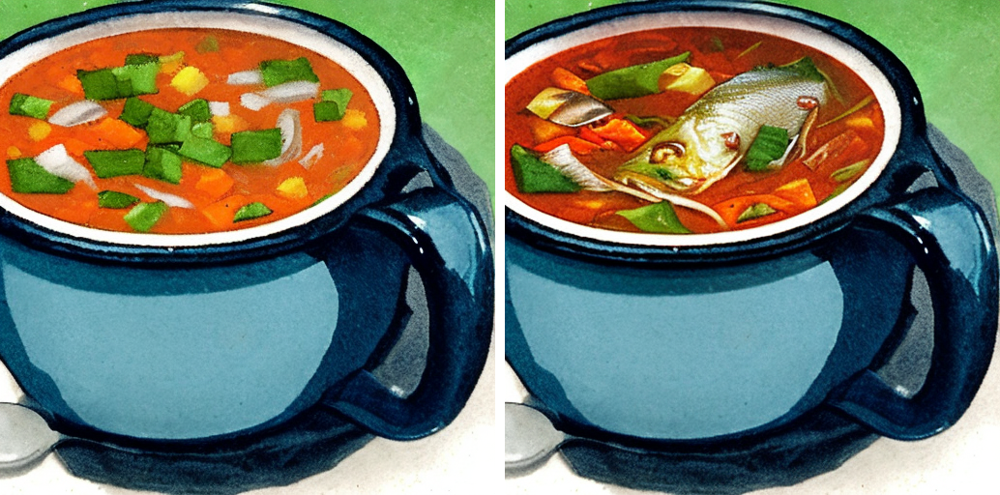

In [ ]:
prompts = ["soup",
           "chinese fish soup"] 

lb = LocalBlend(prompts, ("soup", " fish soup"))

controller = AttentionRefine(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8,
                             self_replace_steps=.4,
                             local_blend=lb)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)

### Change Context of Image with SPECIFIC Attention WORDS
--> Helping to edit Image with what we want 

In [ ]:
### Increasing the attention to certain word

prompts = ["a smiling bunny doll"] * 2
### pay 8 times more attention to the word "smiling"
equalizer = get_equalizer(prompts[1], ("smiling",), (10,))
controller = AttentionReweight(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8,
                               self_replace_steps=.4,
                               equalizer=equalizer)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)

NameError: name 'x_t' is not defined

  0%|          | 0/51 [00:00<?, ?it/s]

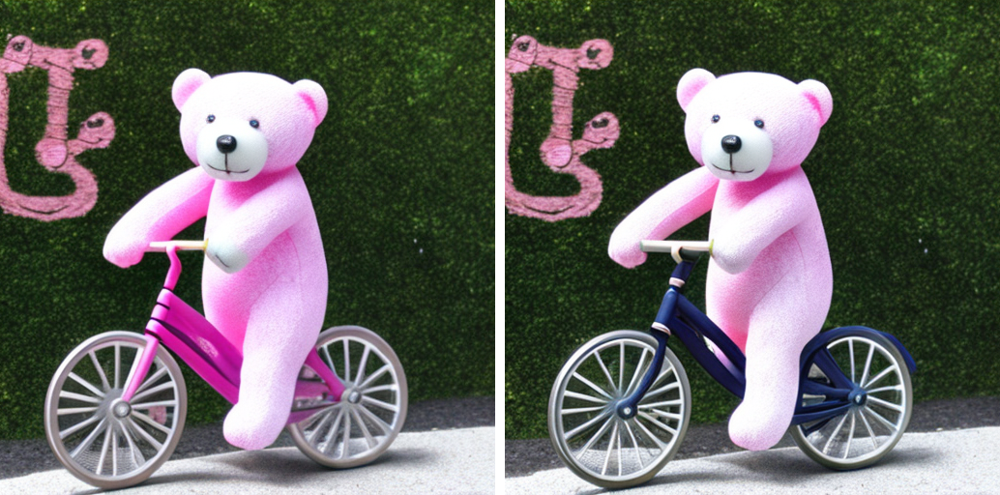

In [7]:
#### Reducing the Attention 

prompts = ["pink bear riding a bicycle"] * 2

### we don't wont pink bikes, only pink bear.
### we reduce the amount of pink but apply it locally on the bikes (attention re-weight + local mask )

### pay less attention to the word "pink"
equalizer = get_equalizer(prompts[1], ("pink",), (-1,))

### apply the edit on the bikes 
lb = LocalBlend(prompts, ("bicycle", "bicycle"))
controller = AttentionReweight(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8,
                               self_replace_steps=.4,
                               equalizer=equalizer,
                               local_blend=lb)
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)


### Refinement The Context image --> Paymore Attention to the specific words
--> make editting prompt to influence then pay more attention on certain words for the Editting Prompt 
Step.1 Refine the image 
Step.2 Output image  --> Pay more attention to the word we want

  0%|          | 0/51 [00:00<?, ?it/s]

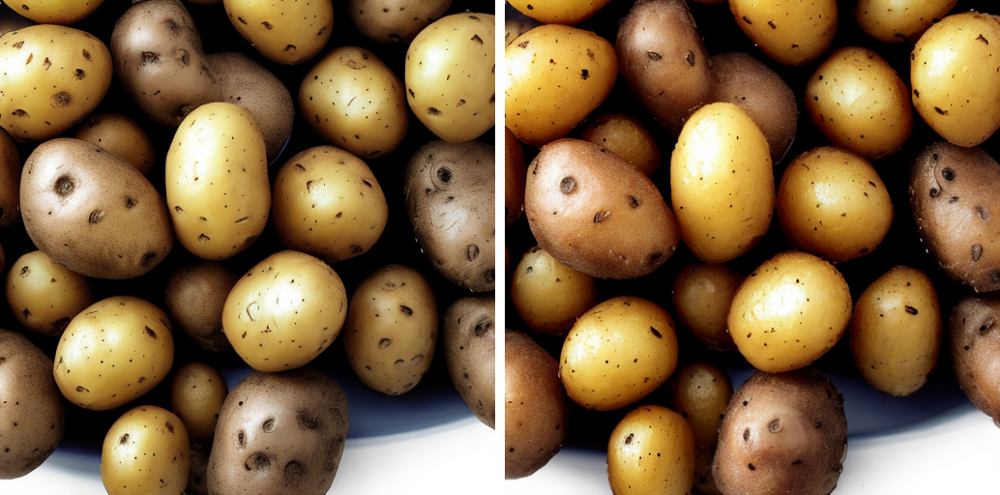

In [8]:
prompts= ["potatos",
           "fried potatos"] 
lb = LocalBlend(prompts, ("potatos", "potatos"))
controller = AttentionRefine(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8,self_replace_steps=.4, local_blend=lb )
_ = run_and_display(prompts, controller, latent=x_t, run_baseline=False)


  0%|          | 0/51 [00:00<?, ?it/s]

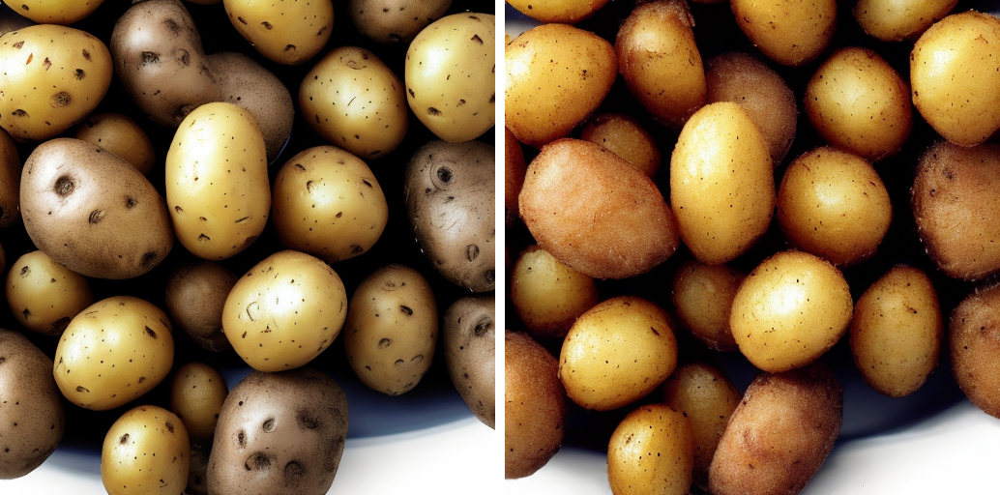

In [9]:
prompts = ["potatos",
           "fried potatos"] 
lb = LocalBlend(prompts, ("potatos", "potatos"))
controller = AttentionRefine(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8, 
                             self_replace_steps=.4, local_blend=lb)
### pay 10 times more attention to the word "fried"
equalizer = get_equalizer(prompts[1], ("fried",), (10,))
controller = AttentionReweight(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8,
                               self_replace_steps=.4, equalizer=equalizer, local_blend=lb,
                               controller=controller)
_ = run_and_display(prompts, controller, latent=x_t,  run_baseline=False)
